In [33]:
#Imports

#Manipulação dos Dados
import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from sklearn.model_selection import train_test_split, cross_val_score,GridSearchCV, KFold
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, plot_confusion_matrix, plot_roc_curve, confusion_matrix, make_scorer
from sklearn.ensemble import RandomForestClassifier
import pickle

In [2]:
df_train = pd.read_pickle('./train_1.pickle')
df_test = pd.read_pickle('./test_1.pickle')

In [3]:
df_train.shape,df_test.shape

((76020, 142), (75818, 141))

In [6]:
X_train, X_test, y_train, y_test = train_test_split(df_train.drop(['TARGET','ID'], axis = 1), df_train.TARGET, stratify = df_train.TARGET, train_size = 0.80 ,random_state = 42)

In [9]:
smote = SMOTE(sampling_strategy='minority')
X_over, y_over = smote.fit_resample(X_train,y_train)

In [10]:
X_over.shape, y_over.shape

((116820, 140), (116820,))

In [11]:
(y_over.value_counts()/y_over.count())*100

0    50.0
1    50.0
Name: TARGET, dtype: float64

In [14]:
params_rf = {'class_weight':'balanced',
             'max_leaf_nodes':250,
             'max_depth': 1000,
             'min_samples_leaf': 3,
             'min_samples_split': 100,
             'n_estimators': 2000,
             'random_state': 12345}

rf_optimized = RandomForestClassifier(**params_rf)
rf_optimized.fit(X_over, y_over)

RandomForestClassifier(class_weight='balanced', max_depth=1000,
                       max_leaf_nodes=250, min_samples_leaf=3,
                       min_samples_split=100, n_estimators=2000,
                       random_state=12345)

In [18]:
# save the model to disk
filename = 'rf_optimized_model.sav'
pickle.dump(rf_optimized, open(filename, 'wb'))

In [ ]:
# load the model from disk
# loaded_model = pickle.load(open(filename, 'rb'))
# result = loaded_model.score(X_test, Y_test)
# print(result)

In [19]:
previsoes_rf = rf_optimized.predict(X_test)

In [20]:
accuracy_score(y_test, previsoes_rf)

0.8468823993685872

In [21]:
confusion_matrix(y_test, previsoes_rf)

array([[12506,  2096],
       [  232,   370]], dtype=int64)

In [22]:
print(classification_report(y_test, previsoes_rf))

              precision    recall  f1-score   support

           0       0.98      0.86      0.91     14602
           1       0.15      0.61      0.24       602

    accuracy                           0.85     15204
   macro avg       0.57      0.74      0.58     15204
weighted avg       0.95      0.85      0.89     15204



In [23]:
previsoes_treino = rf_optimized.predict(X_over)

In [24]:
accuracy_score(y_over, previsoes_treino)

0.8486988529361411

In [25]:
confusion_matrix(y_over, previsoes_treino)

array([[50186,  8224],
       [ 9451, 48959]], dtype=int64)

In [26]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [30]:
# Separando os dados em folds
kfold = KFold(n_splits = 5, shuffle=True, random_state = 5)

In [29]:
previsor = df_train.copy()
alvo = previsor.TARGET

In [31]:
resultado = cross_val_score(rf_optimized, previsor, alvo, cv = kfold)
resultado

array([0.99973691, 0.99986846, 0.99980268, 0.99973691, 0.99973691])

In [32]:
# Usamos a média e o desvio padrão
print("Acurácia Média: %.2f%%" % (resultado.mean() * 100.0))

Acurácia Média: 99.98%


In [35]:
tl = TomekLinks(sampling_strategy='majority')
X_under, y_under = tl.fit_resample(X_train,y_train)

In [36]:
X_under.shape, y_under.shape

((59830, 140), (59830,))

In [37]:
(y_under.value_counts()/y_under.count())*100

0    95.978606
1     4.021394
Name: TARGET, dtype: float64

In [38]:
rf_optimized.fit(X_under, y_under)

RandomForestClassifier(class_weight='balanced', max_depth=1000,
                       max_leaf_nodes=250, min_samples_leaf=3,
                       min_samples_split=100, n_estimators=2000,
                       random_state=12345)

In [39]:
previsoes_rf = rf_optimized.predict(X_test)

In [40]:
accuracy_score(y_test, previsoes_rf)

0.838726650881347

In [41]:
confusion_matrix(y_test, previsoes_rf)

array([[12364,  2238],
       [  214,   388]], dtype=int64)

In [42]:
from sklearn.preprocessing import StandardScaler

In [50]:
previsores_esc = StandardScaler().fit_transform(df_train)

In [51]:
previsores_esc

array([[-1.73504275, -0.07583503, -0.96900192, ..., -1.61560274,
        -0.20297465, -0.12728502],
       [-1.73499707, -0.07583503,  0.27908818, ..., -1.20769065,
        -0.20297465, -0.12728502],
       [-1.73497423, -0.07583503, -0.96900192, ..., -0.65080256,
        -0.20297465, -0.12728502],
       ...,
       [ 1.7329391 , -0.07583503, -0.96900192, ..., -0.48172311,
        -0.20297465, -0.12728502],
       [ 1.73296194, -0.07583503, -0.96900192, ..., -0.25039843,
        -0.20297465, -0.12728502],
       [ 1.73300762, -0.07583503,  1.52717829, ...,  0.33953018,
        -0.20297465, -0.12728502]])

In [52]:
previsores_esc.shape

(76020, 142)

In [53]:
from sklearn.decomposition import PCA

In [54]:
pca = PCA(n_components=2)

In [55]:
previsores_esc_pca = pca.fit_transform(previsores_esc)

In [56]:
previsores_esc_pca

array([[-2.78692793, -1.39795677],
       [-0.57612874,  7.96369253],
       [-1.95226536, -0.82159853],
       ...,
       [-1.97663118, -0.84090863],
       [-1.90031235, -0.78637619],
       [-2.64967546, -1.18914808]])

In [57]:
pca.explained_variance_ratio_

array([0.1683478 , 0.11681649])

In [58]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 5, max_iter = 300)
    kmeans.fit(previsores_esc_pca)
# Método inertia para gerar o wcss
    wcss.append(kmeans.inertia_)

In [61]:
wcss

[3078302.913919308,
 1865129.7807801557,
 831035.9332084674,
 567656.8982795044,
 451517.34582803206,
 359321.0435328671,
 311192.41399419814,
 276720.95676816005,
 246838.88444742438,
 217926.0249906597]

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

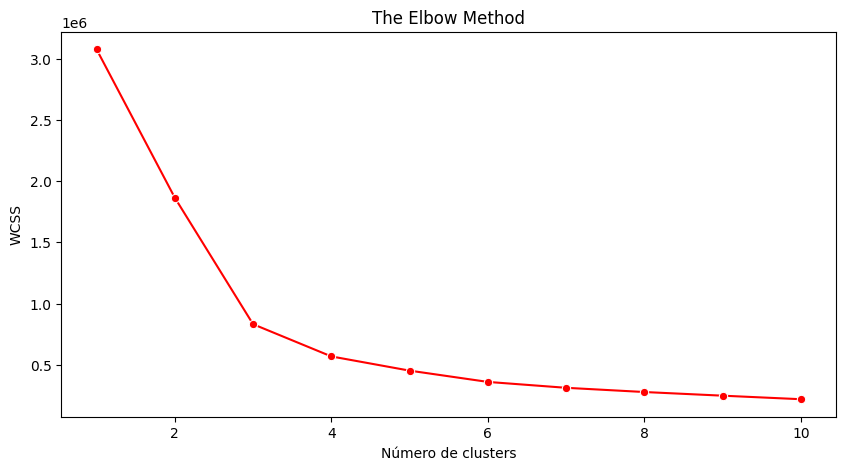

In [62]:
plt.figure(figsize=(10,5))
sns.lineplot(x=range(1, 11), y=wcss,marker='o',color='red')
plt.title('The Elbow Method')
plt.xlabel('Número de clusters')
plt.ylabel('WCSS');

In [63]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++', random_state = 5, max_iter = 300)

In [64]:
kmeans3 = kmeans.fit(previsores_esc_pca)

In [65]:
# Coordenadas dos Centróides
centroides = kmeans3.cluster_centers_
centroides

array([[-1.81108196, -0.81780787],
       [ 6.134775  , -1.79636301],
       [21.71100523, -5.58972177],
       [ 3.1366261 , 12.04344855]])

In [66]:
# Classificação dos dados
classificacao3 = kmeans3.labels_
classificacao3

array([0, 3, 0, ..., 0, 0, 0])

In [67]:
import plotly.express as px
import plotly.graph_objects as go

In [68]:
graf1 = px.scatter(x = previsores_esc_pca[:,0], y = previsores_esc_pca[:,1], color=classificacao3)
graf2 = px.scatter(x = centroides[:,0], y = centroides[:,1], size = [15, 15, 15, 15])
graf3 = go.Figure(data = graf1.data + graf2.data)
graf3.update_layout(width=800,height=500,title_text='Agrupamento K-Means com PCA')
graf3.update_xaxes(title = 'Componente 1')
graf3.update_yaxes(title = 'Componente 2')
graf3.show()

In [69]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
dendrograma = dendrogram(linkage(previsores_esc_pca, method = 'complete'))